In [1]:
import sys
sys.path.append('../src')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

from eda import get_unique_val, get_missing_values

import matplotlib.pyplot as plt
plt.style.use('dark_background')

import matplotlib.colors as mcolors
import seaborn as sns
dark2 = sns.color_palette('Dark2')
hex_dark2 = [mcolors.to_hex(color) for color in dark2]

import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
pio.renderers.default='notebook'
py.init_notebook_mode(connected=True)

# custom template
custom_template = pio.templates["plotly_dark"]
custom_template.layout.colorway = hex_dark2
custom_template.layout.hoverlabel = dict(bgcolor='black', font_color='white')

pio.templates.default = custom_template

In [3]:
# read the data
df_ps = pd.read_csv("../data/dataset.csv")
df_ps.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0.0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,1

In [4]:
df_ps.shape

(91713, 186)

In [5]:
df_ps.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 186 columns):
 #    Column                         Dtype  
---   ------                         -----  
 0    encounter_id                   int64  
 1    patient_id                     int64  
 2    hospital_id                    int64  
 3    hospital_death                 int64  
 4    age                            float64
 5    bmi                            float64
 6    elective_surgery               int64  
 7    ethnicity                      object 
 8    gender                         object 
 9    height                         float64
 10   hospital_admit_source          object 
 11   icu_admit_source               object 
 12   icu_id                         int64  
 13   icu_stay_type                  object 
 14   icu_type                       object 
 15   pre_icu_los_days               float64
 16   readmission_status             int64  
 17   weight                       

In [6]:
cols = ', '.join(df_ps.columns)
print(cols)

encounter_id, patient_id, hospital_id, hospital_death, age, bmi, elective_surgery, ethnicity, gender, height, hospital_admit_source, icu_admit_source, icu_id, icu_stay_type, icu_type, pre_icu_los_days, readmission_status, weight, albumin_apache, apache_2_diagnosis, apache_3j_diagnosis, apache_post_operative, arf_apache, bilirubin_apache, bun_apache, creatinine_apache, fio2_apache, gcs_eyes_apache, gcs_motor_apache, gcs_unable_apache, gcs_verbal_apache, glucose_apache, heart_rate_apache, hematocrit_apache, intubated_apache, map_apache, paco2_apache, paco2_for_ph_apache, pao2_apache, ph_apache, resprate_apache, sodium_apache, temp_apache, urineoutput_apache, ventilated_apache, wbc_apache, d1_diasbp_invasive_max, d1_diasbp_invasive_min, d1_diasbp_max, d1_diasbp_min, d1_diasbp_noninvasive_max, d1_diasbp_noninvasive_min, d1_heartrate_max, d1_heartrate_min, d1_mbp_invasive_max, d1_mbp_invasive_min, d1_mbp_max, d1_mbp_min, d1_mbp_noninvasive_max, d1_mbp_noninvasive_min, d1_resprate_max, d1_re

In [7]:
# find categorical features
obj_cols = df_ps.select_dtypes(include='object').columns
print(obj_cols)

Index(['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source',
       'icu_stay_type', 'icu_type', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object')


In [8]:
# check unique values for categorical variables
for col in obj_cols:
    print('-' * 30)
    print(col)
    print('-' * 30)
    print(get_unique_val(df_ps[col]))
    

------------------------------
ethnicity
------------------------------
ethnicity
Caucasian           77.07
African American    10.41
Other/Unknown        4.77
Hispanic             4.14
NaN                  1.52
Asian                1.23
Native American      0.86
Name: count, dtype: float64
------------------------------
gender
------------------------------
gender
M      53.94
F      46.03
NaN     0.03
Name: count, dtype: float64
------------------------------
hospital_admit_source
------------------------------
hospital_admit_source
Emergency Department    40.30
NaN                     23.34
Operating Room          10.67
Floor                    8.78
Direct Admit             7.02
Recovery Room            3.16
Acute Care/Floor         2.08
Other Hospital           1.79
Step-Down Unit (SDU)     1.23
PACU                     1.11
Other ICU                0.25
Chest Pain Center        0.15
ICU to SDU               0.05
ICU                      0.04
Observation              0.01
Other    

Features - encounter_id, patient_id, hospital_id, icu_id, hospital_admit_source, icu_admit_source, icu_stay_type, readmission_status do not add value to the model. Therefore these features can be dropped.

In [9]:
df_ps.shape

(91713, 186)

In [10]:
df_ps.drop(['encounter_id', 'patient_id', 'hospital_id', 'icu_id', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'readmission_status'], axis=1, inplace=True)

In [11]:
df_ps.shape

(91713, 178)

In [12]:
# find missing values
df_miss = get_missing_values(df_ps)
df_miss

,col,dtype,miss_val,pct_miss_val
0,h1_bilirubin_min,float64,84619,92.27
1,h1_bilirubin_max,float64,84619,92.27
2,h1_lactate_min,float64,84369,91.99
3,h1_lactate_max,float64,84369,91.99
4,h1_albumin_min,float64,83824,91.40
5,h1_albumin_max,float64,83824,91.40
6,h1_pao2fio2ratio_min,float64,80195,87.44
7,h1_pao2fio2ratio_max,float64,80195,87.44
8,h1_arterial_ph_min,float64,76424,83.33
9,h1_arterial_ph_max,float64,76424,83.33


In [13]:
print(df_miss.shape)
print(df_ps.shape)

(173, 4)
(91713, 178)


In [14]:
# 2 ways we can drop columns that have null values above a certain threshold
# First approach is by missing count row and second is using missing percent count

# First approach
# cols_miss_val = df_ps.columns[df_ps.isnull().sum(axis=0) > 25000] # First approach

# Second approach - we drop columns that have more 50% of missing values
cols_miss_val = df_miss['col'][df_miss['pct_miss_val'] > 50.0] # Second approach
df_ps.drop(cols_miss_val, axis=1, inplace=True)

In [15]:
df_ps.shape

(91713, 104)

In [16]:
# find number of rows where bmi, height or weight has a null
np.sum(df_ps[['bmi', 'height', 'weight']].isna().sum(axis=1) > 0)

3429

There are 3429 rows that have null values in bmi, height or weight. Since these are related columns and 3429 is approx. 3.7% of the dataset, we will drop these rows

In [17]:
# the boolean mask gives all records where all 3 features have value. by sub-setting we we remove records that has a null in any one or more of these 3 cols
df_ps = df_ps[df_ps[['bmi', 'height', 'weight']].isna().sum(axis=1) == 0]
print(df_ps.shape)

(88284, 104)


#### Univariate - Multivariate Analysis

In [18]:
fig = px.histogram(df_ps[['age', 'gender', 'hospital_death', 'bmi']].dropna(),
                   x='age', 
                   color='gender',
                   marginal='box',
                   hover_data = df_ps[['age', 'gender', 'hospital_death', 'bmi']])
fig.update_layout(
    yaxis_title='hospital death count'
)
fig.show()

The death rate for females is higher than males across all ages.

In [19]:
f_prob_age = df_ps[df_ps['gender']=='F'][['age', 'hospital_death']].groupby('age').mean().reset_index()
m_prob_age = df_ps[df_ps['gender']=='M'][['age', 'hospital_death']].groupby('age').mean().reset_index()

fig = make_subplots()

fig.add_trace(
    go.Scatter(x=f_prob_age['age'], y=f_prob_age['hospital_death'], name='Female'))
fig.add_trace(
    go.Scatter(x=m_prob_age['age'], y=m_prob_age['hospital_death'], name='Male'))
fig.update_layout(
    title_text="Average hospital death probability by age")
fig.update_xaxes(title_text="age")
fig.update_yaxes(title_text="Average Hospital Death", secondary_y=False)
fig.show()

In [20]:
df_bmi = df_ps[['bmi', 'hospital_death']]
df_bmi['bmi'] = df_bmi['bmi'].round(0)
bmi_prob = df_bmi.groupby('bmi').mean().reset_index()
fig = px.line(bmi_prob, x=bmi_prob['bmi'], y=bmi_prob['hospital_death'])
fig.show()


We see an increase in average hospital death when the bmi is too low or too high.

In [21]:
df_weight = df_ps[['weight', 'hospital_death']]
df_weight['weight'] = df_weight['weight'].round(0)
weight_prob = df_weight.groupby('weight').mean().reset_index()
fig = px.line(weight_prob, x=weight_prob['weight'], y=weight_prob['hospital_death'])
fig.show()


Similary at very low and very high weight levels, we see increase in average hospital death.

In [22]:
df_icu = df_ps[['icu_type', 'age', 'hospital_death']]
df_icu['icu_type'] = df_icu['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})

icu_prob = df_icu.groupby(['icu_type', 'age']).mean().reset_index()
icu_prob['count'] = df_icu.groupby(['icu_type', 'age']).count().reset_index()['hospital_death']

fig = px.scatter(icu_prob, x='age', y='hospital_death', size='count', color='icu_type', hover_name='icu_type', log_x=False, size_max=60)
fig.update_layout(
    title_text="Survival Rate by ICU type")
fig.update_xaxes(title_text="Age")
fig.update_yaxes(title_text="Average Hospital Death", secondary_y=False)
fig.show()

In [23]:
df_apache3 = df_ps[['age','apache_3j_bodysystem','hospital_death']]
prob_apache3 = df_apache3.groupby(['apache_3j_bodysystem','age']).agg(['size','mean']).reset_index()

prob_apache3['size'] = prob_apache3['hospital_death']['size']
prob_apache3['mean'] = prob_apache3['hospital_death']['mean']

prob_apache3.drop('hospital_death', axis=1, inplace=True)


bodysystems =list(prob_apache3['apache_3j_bodysystem'].unique())
data = []
list_updatemenus = []

for n, bs in enumerate(bodysystems):
    visible = [False] * len(bodysystems)
    visible[n] = True
    temp_dict = dict(label = str(bs),
                 method = 'update',
                 args = [{'visible': visible},
                         {'title': '<b>'+ bs +'<b>'}])
    list_updatemenus.append(temp_dict)
    

for bs in bodysystems:
    mask = (prob_apache3['apache_3j_bodysystem'].values == bs) 
    trace = (dict(visible = False,     
        x = prob_apache3.loc[mask, 'age'],
        y = prob_apache3.loc[mask, 'mean'],
        mode = 'markers',
        marker = {'size':prob_apache3.loc[mask, 'size']/prob_apache3.loc[mask,'size'].sum()*1000,
                 'color':prob_apache3.loc[mask, 'mean'],
                 'showscale': True})
                   )
    data.append(trace)

data[0]['visible'] = True    

layout = dict(updatemenus=list([dict(buttons= list_updatemenus)]),
              xaxis=dict(title = 'Age', range=[min(prob_apache3.loc[:, 'age'])-10, max(prob_apache3.loc[:, 'age']) + 10]),
              yaxis=dict(title = 'Average Hospital Death', range=[min(prob_apache3.loc[:, 'mean'])-0.1, max(prob_apache3.loc[:, 'mean'])+0.1]),
              title='Survival Rate' )
fig = dict(data=data, layout=layout)
py.iplot(fig, filename='update_dropdown')

C:\Users\sfg\AppData\Local\Temp\ipykernel_3552\1773965015.py:7: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



#### Density distribution for numerical columns

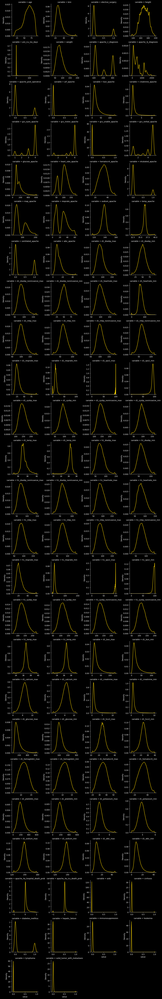

In [24]:
df_unpivot = pd.melt(df_ps, df_ps.describe().columns[0], df_ps.describe().columns[1:])
g = sns.FacetGrid(df_unpivot, col="variable", col_wrap=4, sharex=False, sharey=False)
g.map(sns.kdeplot, "value", color="gold")
plt.show()

In [25]:
df_ps.shape

(88284, 104)